In [1]:
import os
import joblib
import numpy as np
import pandas as pd
from scipy.sparse import hstack
from sklearn.cluster import MiniBatchKMeans
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import silhouette_score
from sklearn.utils import resample
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [2]:
diretorio_destino = '../vetores'

tfidf_title = joblib.load(f"{diretorio_destino}/tfidf_title.pkl")
tfidf_abstract = joblib.load(f"{diretorio_destino}/tfidf_abstract.pkl")
X = hstack([tfidf_title, tfidf_abstract])

In [3]:
n_clusters = 45
batch_size = 20000

kmeans = MiniBatchKMeans(n_clusters=n_clusters, batch_size=batch_size, random_state=42)
kmeans.fit(X)

MiniBatchKMeans(batch_size=20000, n_clusters=45, random_state=42)

In [7]:
n_samples = 100000
X_sample, labels_sample = resample(X, kmeans.labels_, n_samples=n_samples, random_state=42)

In [8]:
silhouette_avg = silhouette_score(X_sample, labels_sample)
print(f"Silhouette Score (subamostra): {silhouette_avg}")

Silhouette Score (subamostra): 0.006843359478296032


In [4]:
# Reduzir dimensionalidade com TruncatedSVD
svd = TruncatedSVD(n_components=2, random_state=42)
X_reduced = svd.fit_transform(X)

/home/matt/anaconda3/envs/nlp-cluster/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


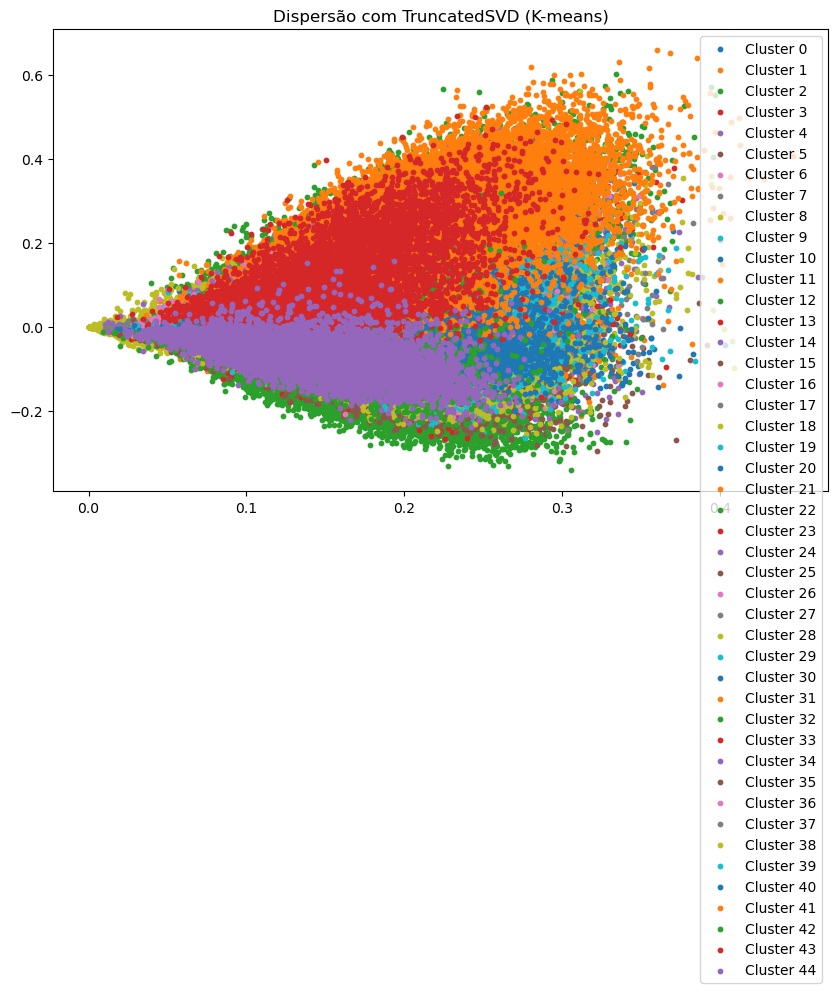

In [5]:
# Plotar os clusters em 2D
plt.figure(figsize=(10, 6))
for i in range(n_clusters):
    mask = kmeans.labels_ == i
    plt.scatter(X_reduced[mask, 0], X_reduced[mask, 1], label=f'Cluster {i}', s=10)
plt.title("Dispersão com TruncatedSVD (K-means)")
plt.legend()
plt.show()

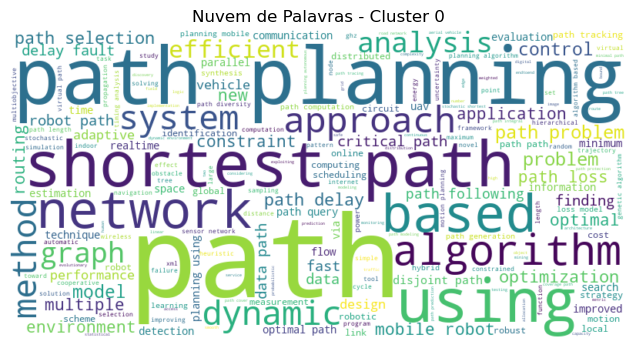

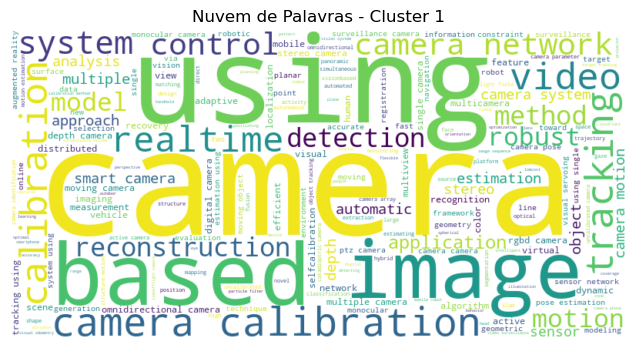

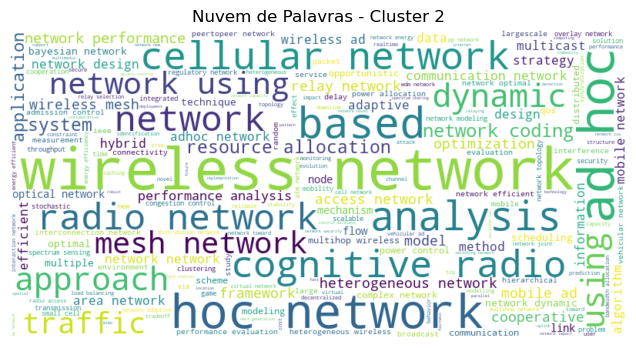

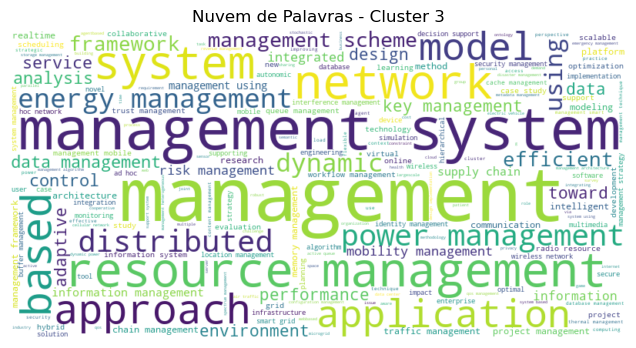

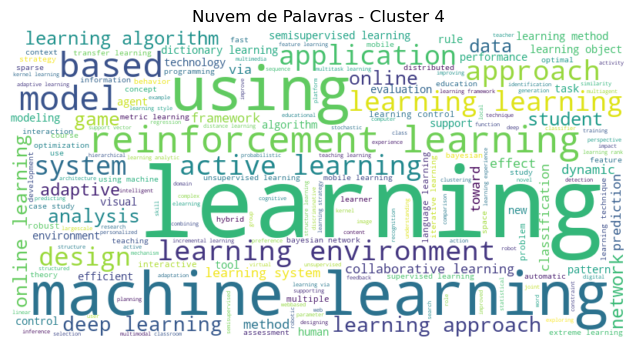

...

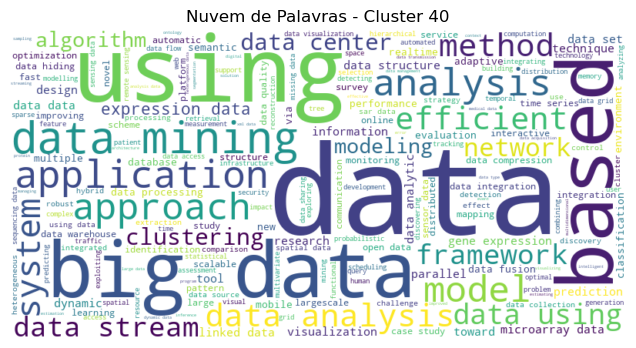

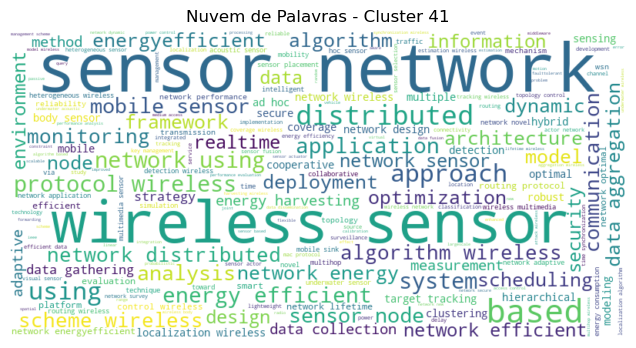

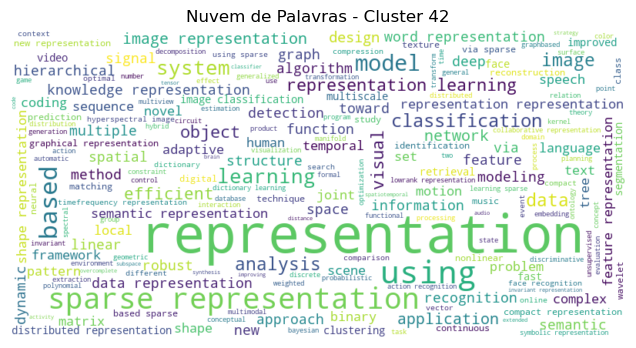

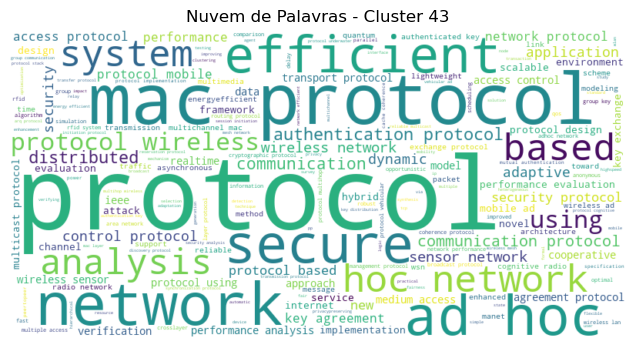

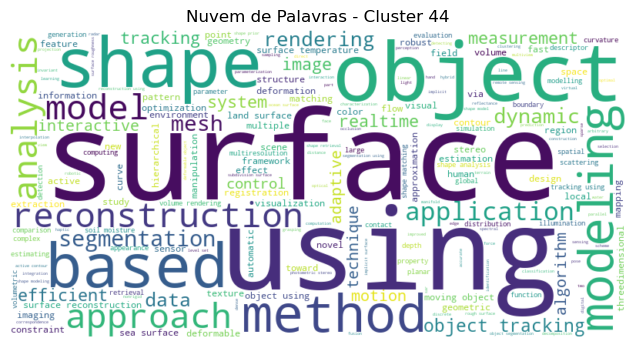

In [6]:
# Gerar nuvens de palavras para cada cluster
df = pd.read_parquet("../data/dblp-v10-processado.parquet")
df['cluster_kmeans'] = kmeans.labels_
for cluster in range(n_clusters):
    cluster_text = df[df['cluster_kmeans'] == cluster]['title'].apply(lambda x: ' '.join(x)).str.cat(sep=' ')
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cluster_text)
    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Nuvem de Palavras - Cluster {cluster}')
    plt.show()